In [ ]:
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris, load_breast_cancer, load_digits, load_wine
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier
from matplotlib.backends.backend_pdf import PdfPages



In [ ]:
# Загрузка датасетов
iris = load_iris()
cancer = load_breast_cancer()
digits = load_digits()
wine = load_wine()
datasets = [iris, cancer, digits, wine]

In [ ]:
# Параметры решающего дерева
parameter_d = {
    'criterion': ['gini', 'entropy'],  # Критерии для измерения качества разделения
    'splitter': ['best', 'random'],  # Стратегии выбора разделения
    'max_depth': [None, 1],  # Максимальная глубина дерева
    'min_samples_split': [2, 3]  # Минимальное количество выборок для разделения узла
}


Каждый алгоритм машинного обучения имеет свои особенности и требует настройки определенных параметров, чтобы обеспечить оптимальное обучение и предсказания. Некоторые примеры типичных гиперпараметров для различных алгоритмов:

**Случайный лес (Random Forest)**:

**Количество деревьев (n_estimators)**: Определяет, сколько деревьев будет построено в ансамбле.

**Максимальная глубина деревьев (max_depth)** : Ограничивает глубину каждого дерева, предотвращая переобучение.

**Минимальное количество объектов в листе (min_samples_leaf): **Задает минимальное количество объектов, которые должны находиться в каждом листе дерева.

М**аксимальное количество признаков для разбиения (max_features)**: Определяет максимальное количество признаков, которые рассматриваются при каждом разбиении узла.

In [ ]:
# Параметры для случайного леса
parameter_r = {
    'criterion': ['gini', 'entropy'],  # Критерии для измерения качества разделения
    'n_estimators': [5, 6, 7, 8, 9, 10],  # Количество деревьев в лесу
    'max_depth': [None, 1],  # Максимальная глубина деревьев
    'min_samples_split': [2, 3]  # Минимальное количество выборок для разделения узла
}

**GridSearchCV** — это метод для подбора параметров в моделях машинного обучения.

Он позволяет провести решетчатый поиск по заданным наборам гиперпараметров. Для каждой комбинации гиперпараметров применяется кросс-валидация, после чего выбираются наилучшие.

In [ ]:
def unic_forest_rand (data, parameters, save_path):
    # Разбиение уникального_датасета на уникальную_обучающую и уникальную_тестовую выборки
    X_train, X_test, y_train, y_test = train_test_split(data.data, data.target, test_size=0.2, random_state=42)

    # Создание уникального классификатора_случайного_леса
    clas = RandomForestClassifier()

    # Подбор уникальных_оптимальных_параметров с использованием уникальной кросс-валидации
    grid_search = GridSearchCV(clas, parameters, cv=5)
    grid_search.fit(X_train, y_train)

    # Вывод наилучших параметров и наилучшего результата
    print("Лучшие параметры:", grid_search.best_params_)
    print("Лучший результат:", grid_search.best_score_)

    # Создание классификатора случайного леса с наилучшими параметрами
    best_clf = RandomForestClassifier(**grid_search.best_params_)
    best_clf.fit(X_train, y_train)

    # Построение графиков деревьев, входящих в состав случайного леса
    for estimator in best_clf.estimators_:
        plot_tree(estimator, filled=True)
        plt.show()

    with PdfPages(save_path) as pdf:
        for idx, estimator in enumerate(best_clf.estimators_):
            plt.figure()
            plot_tree(estimator, filled=True)
            pdf.savefig()
            plt.close()

In [ ]:
#напишем функцию нвстройки решающего дерева, используя метод GridSearchCV для подбора параметров
def customized_decision_tree(data, parameters, save_path):
    # Разделение датасета на обучающую и тестовую выборки
    X_train, X_test, y_train, y_test = train_test_split(data.data, data.target, test_size=0.2, random_state=42)

    # Создание классификатора дерева решений
    classifier = DecisionTreeClassifier()

    # Подбор оптимальных параметров
    grid_search = GridSearchCV(classifier, parameters, cv=5)
    grid_search.fit(X_train, y_train)

    # Вывод наилучших параметров и наилучшего score
    print("Наилучшие параметры:", grid_search.best_params_)
    print("Наилучший score:", grid_search.best_score_)

    # Создание классификатора дерева решений с наилучшими параметрами
    best_classifier = DecisionTreeClassifier(**grid_search.best_params_)
    best_classifier.fit(X_train, y_train)

    # Построение графика дерева использую преведенные выше параметры
    plt.figure(figsize=(10, 7))
    plot_tree(best_classifier, filled=True)

    # Сохранение графика в формате PDF
    plt.savefig(save_path, format='pdf')
    plt.show()

In [ ]:
def custom_model(data, parameter_d, parameter_r):
    # Разбиение датасета на обучающую и тестовую выборки
    X_train, X_test, y_train, y_test = train_test_split(data.data, data.target, test_size=0.2, random_state=42)

    # Создание решающего дерева
    decision_tree = DecisionTreeClassifier()
    grid_search_d = GridSearchCV(decision_tree, parameter_d, cv=5)
    grid_search_d.fit(X_train, y_train)
    dt_score = grid_search_d.best_score_

    # Создание случайного леса
    random_forest = RandomForestClassifier()
    grid_search_r = GridSearchCV(random_forest, parameter_r, cv=5)
    grid_search_r.fit(X_train, y_train)
    r_score = grid_search_r.best_score_

    # Выбор лучшего метода
    best_method = "Решающее дерево" if dt_score > r_score else "Рандомный лес"

    return best_method

In [ ]:
#определение лучшего метода для каждого из встроенных графиков
for data in datasets:
    best_method = custom_model(data, parameter_d, parameter_r)
    print(f"Лучший метод для {data['DESCR'].splitlines()[0]}: {best_method}")

Лучший метод для .. _iris_dataset:: Рандомный лес
Лучший метод для .. _breast_cancer_dataset:: Рандомный лес
Лучший метод для .. _digits_dataset:: Рандомный лес
Лучший метод для .. _wine_dataset:: Рандомный лес


In [ ]:
plt.rcParams['figure.figsize'] = (45, 15)

# Задание 1. Дерево

.. _iris_dataset:
Наилучшие параметры: {'criterion': 'gini', 'max_depth': None, 'min_samples_split': 2, 'splitter': 'best'}
Наилучший score: 0.9416666666666668


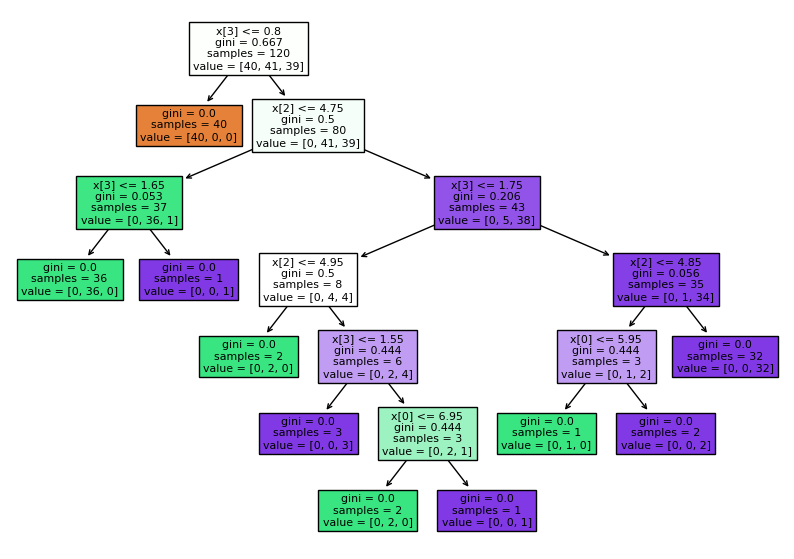

.. _breast_cancer_dataset:
Наилучшие параметры: {'criterion': 'gini', 'max_depth': None, 'min_samples_split': 3, 'splitter': 'random'}
Наилучший score: 0.9428571428571428


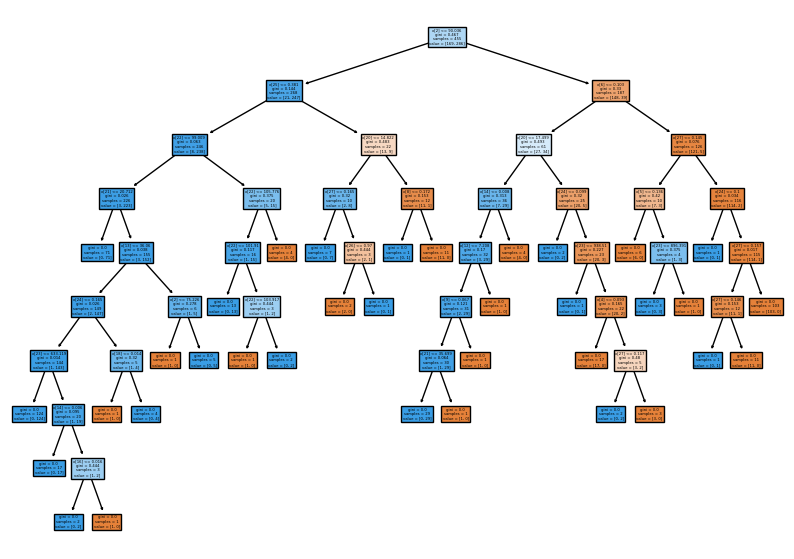

.. _digits_dataset:
Наилучшие параметры: {'criterion': 'entropy', 'max_depth': None, 'min_samples_split': 3, 'splitter': 'best'}
Наилучший score: 0.8503944057297715


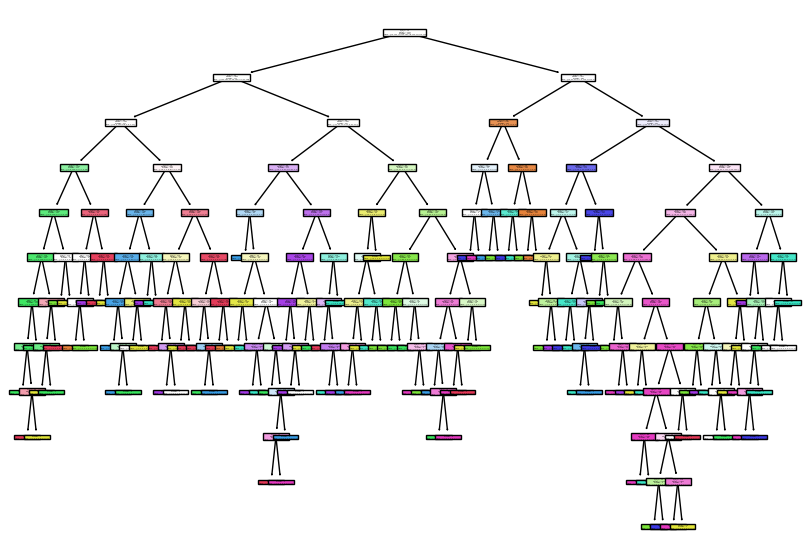

.. _wine_dataset:
Наилучшие параметры: {'criterion': 'gini', 'max_depth': None, 'min_samples_split': 3, 'splitter': 'best'}
Наилучший score: 0.9224137931034484


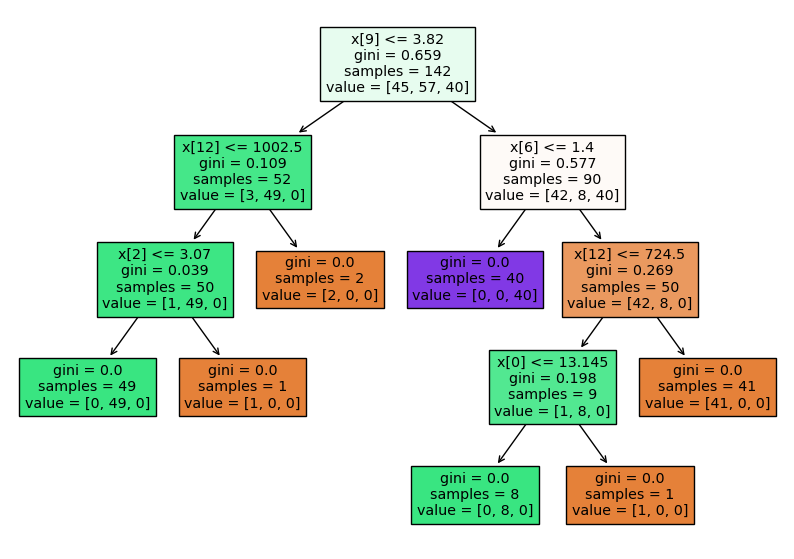

In [ ]:
for data in datasets:
  print (data['DESCR'].splitlines()[0])
  customized_decision_tree(data, parameter_d, f"Save{data['DESCR'].splitlines()[0]}.pdf")

# Задание 2. Лес

.. _iris_dataset:
Лучшие параметры: {'criterion': 'entropy', 'max_depth': None, 'min_samples_split': 3, 'n_estimators': 10}
Лучший результат: 0.9583333333333334


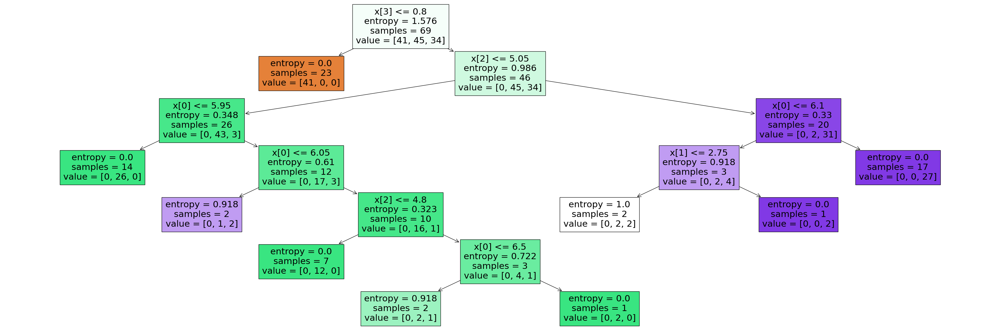

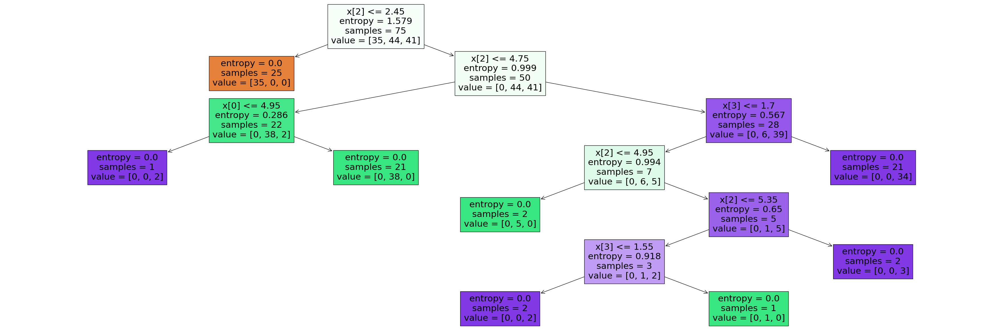

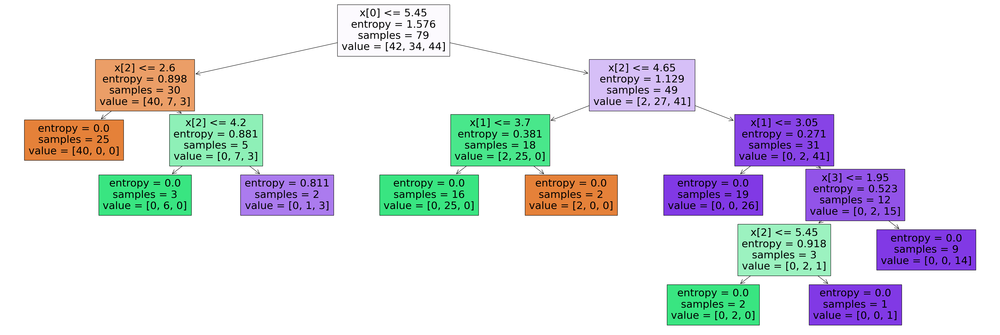

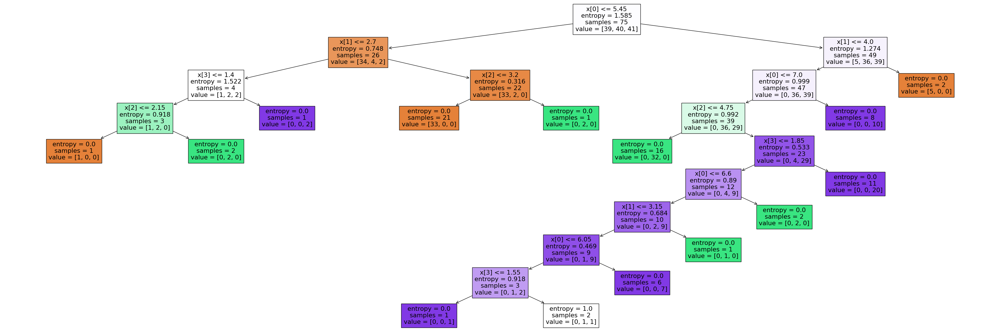

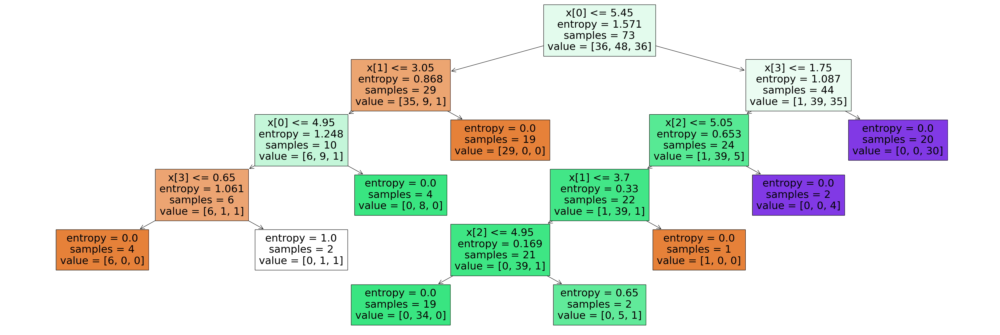

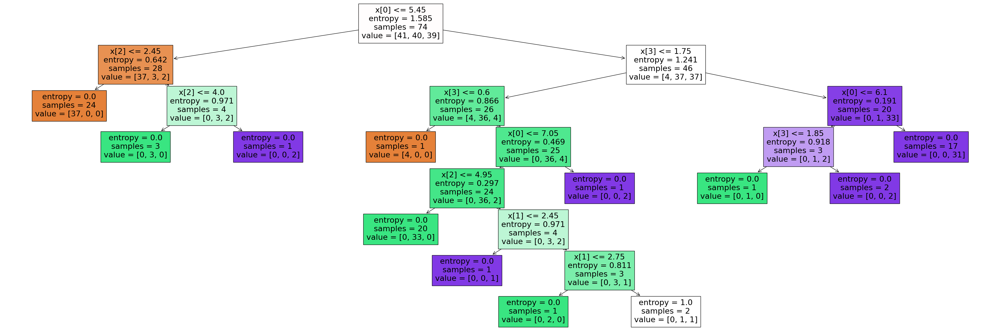

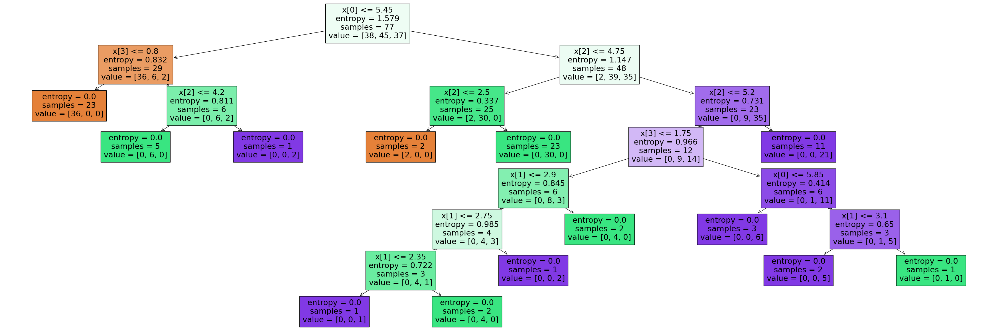

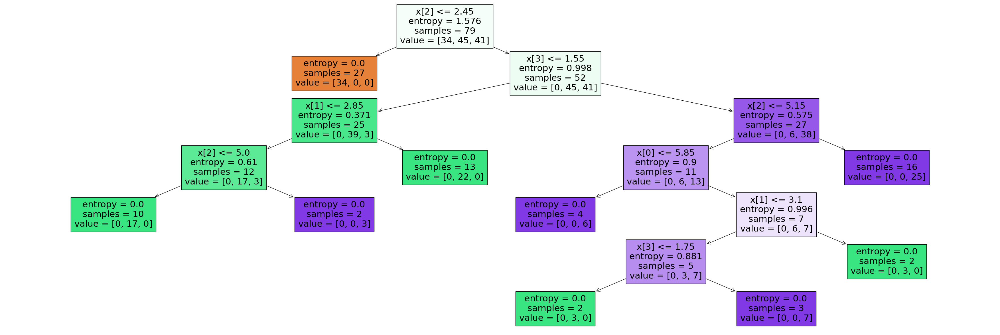

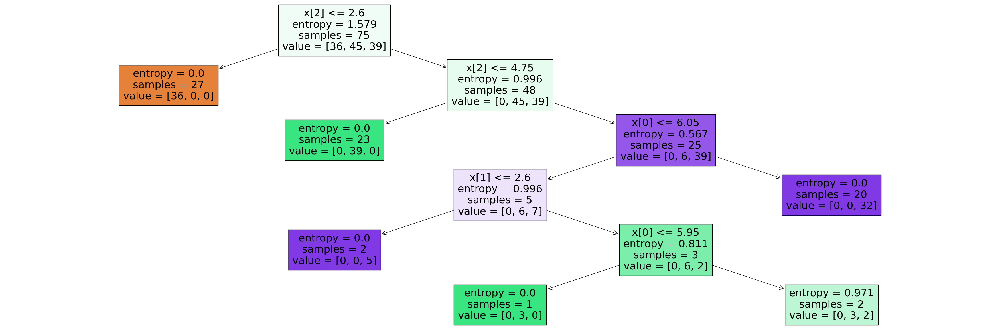

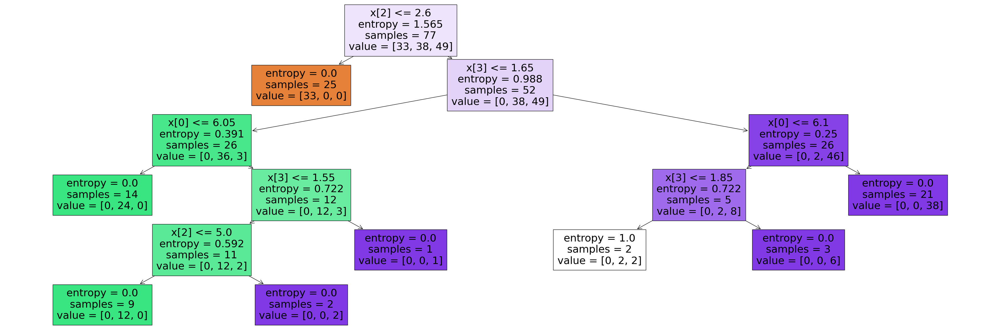

.. _breast_cancer_dataset:
Лучшие параметры: {'criterion': 'gini', 'max_depth': None, 'min_samples_split': 3, 'n_estimators': 10}
Лучший результат: 0.9714285714285715


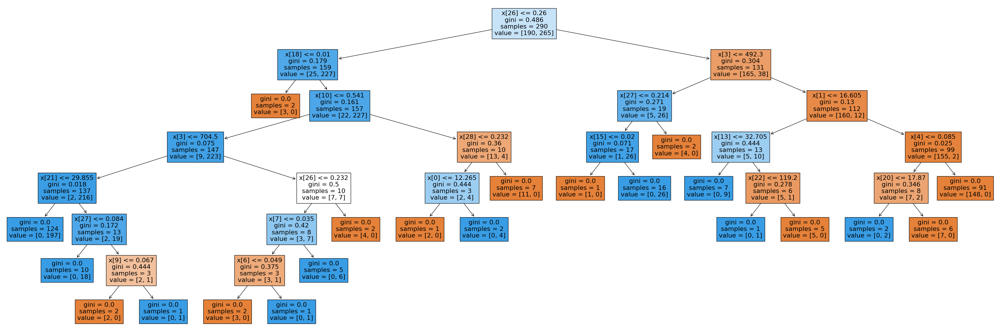

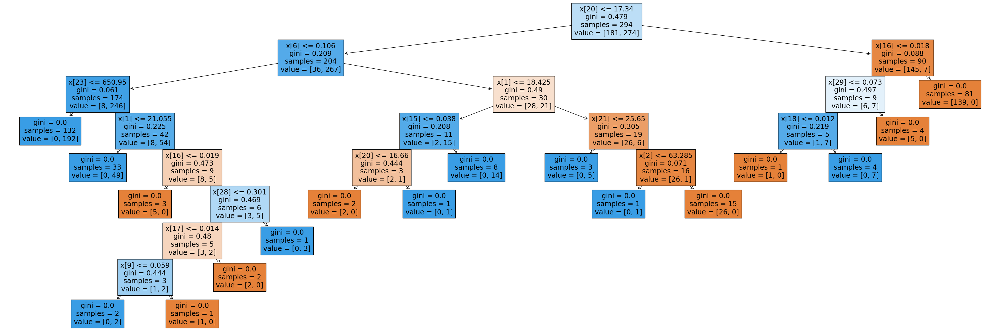

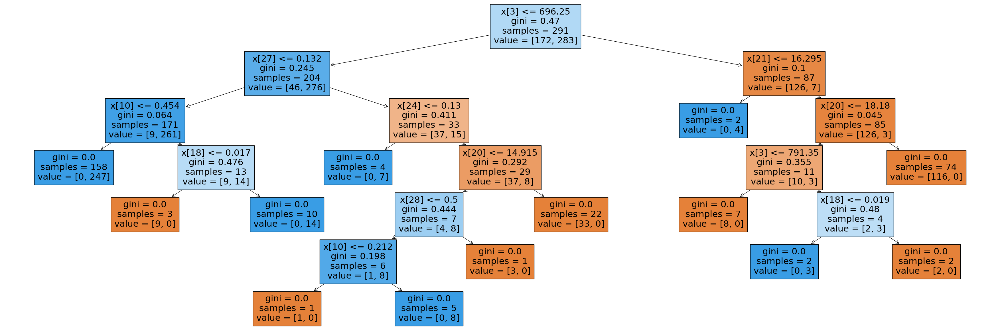

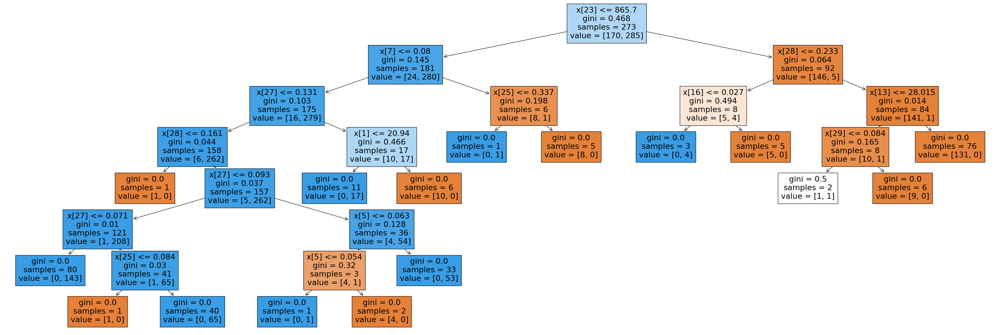

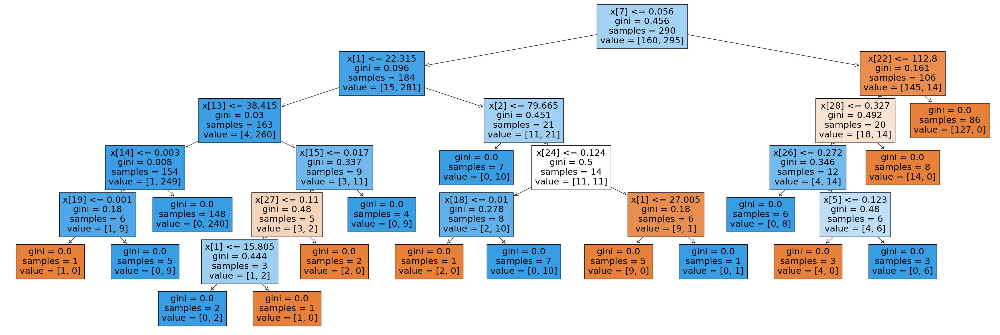

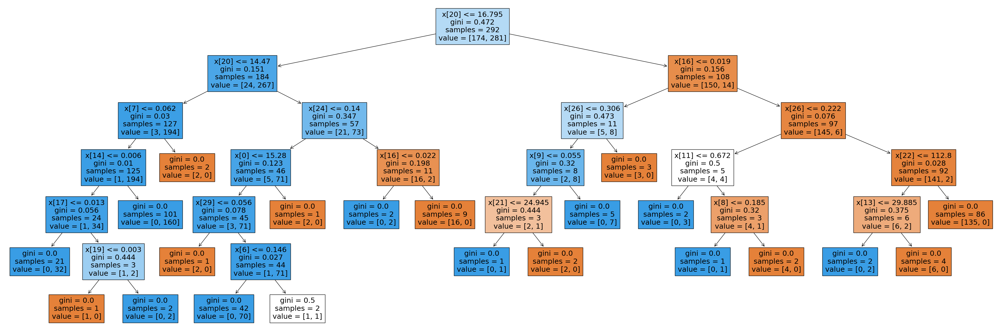

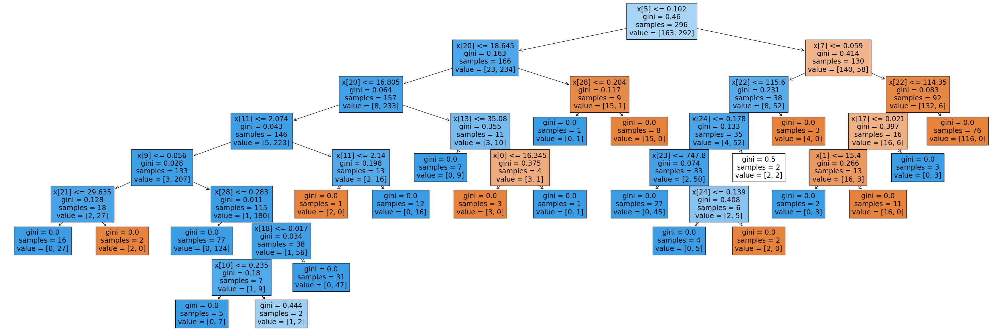

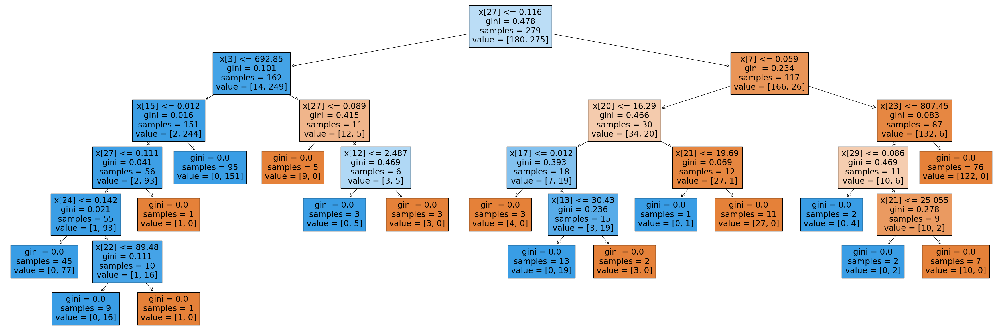

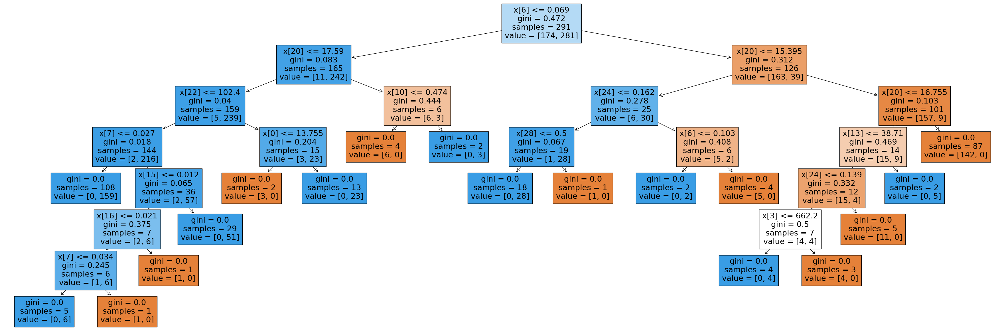

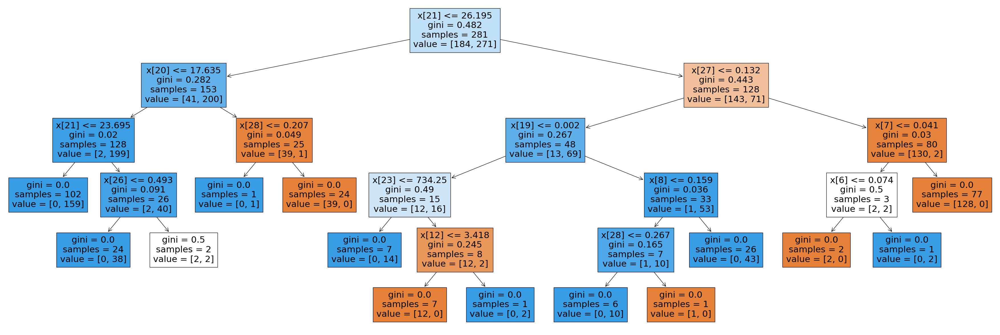

.. _digits_dataset:
Лучшие параметры: {'criterion': 'entropy', 'max_depth': None, 'min_samples_split': 3, 'n_estimators': 10}
Лучший результат: 0.9422570654277971


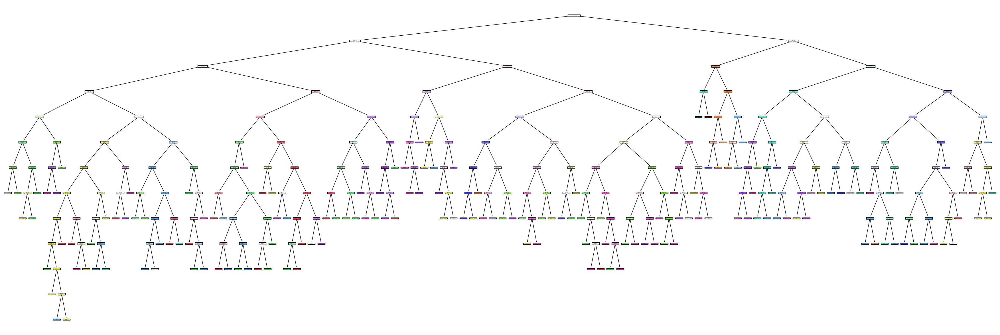

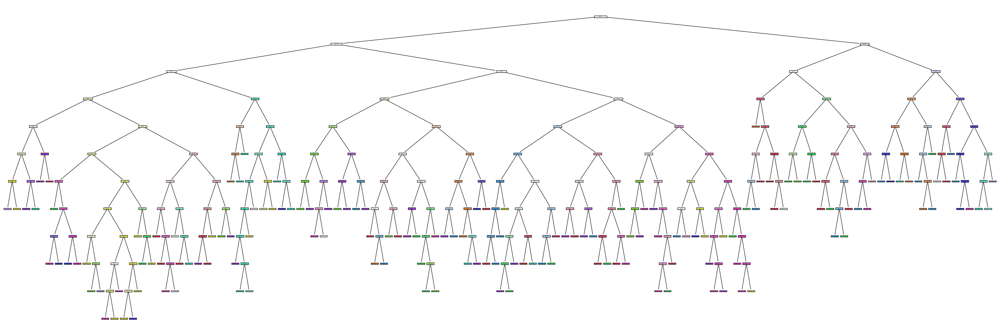

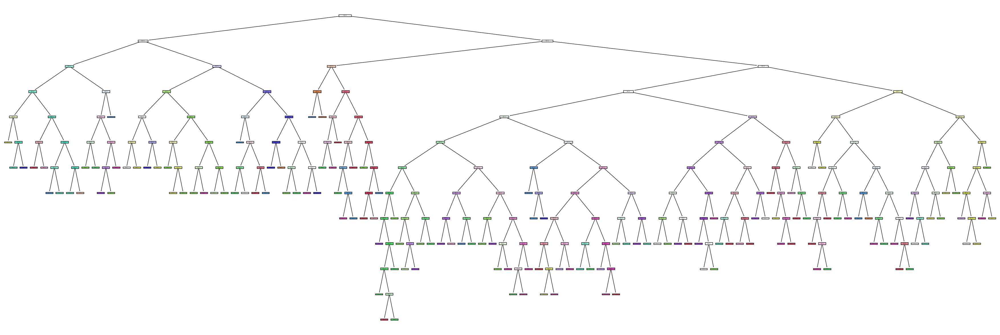

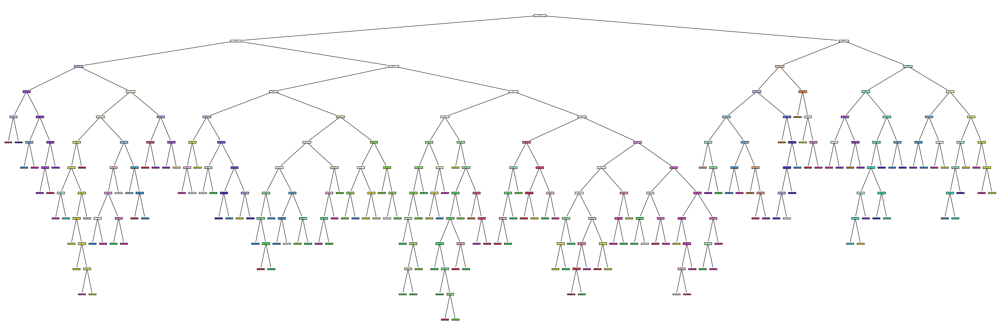

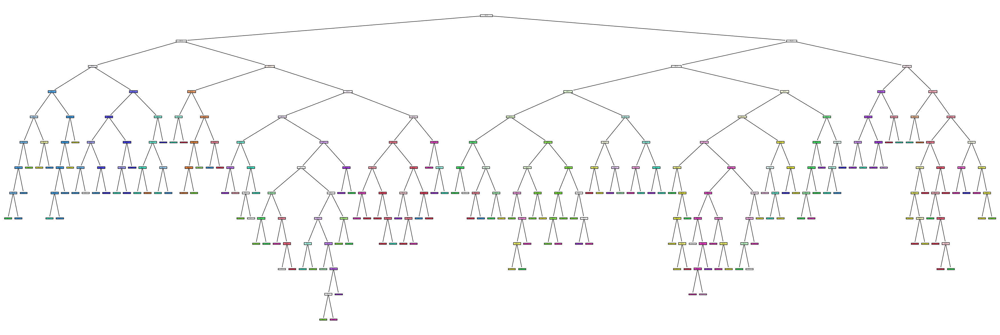

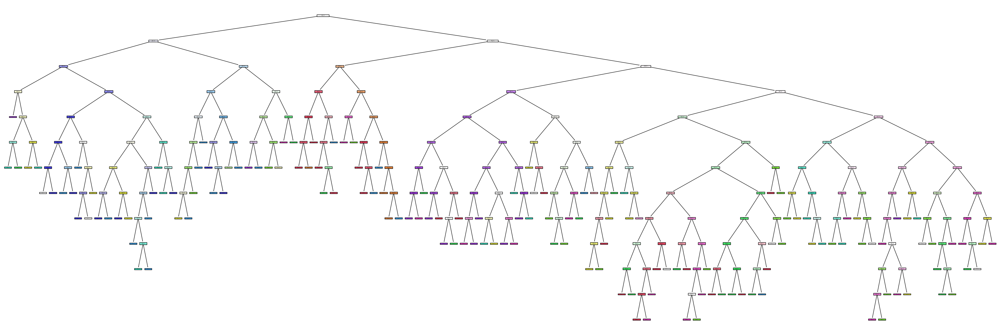

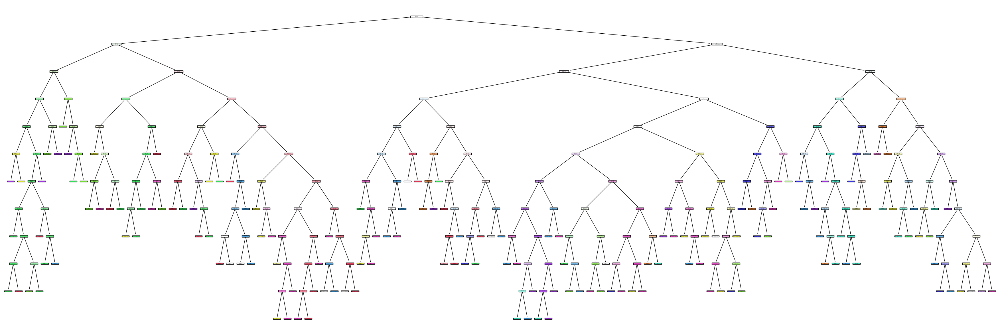

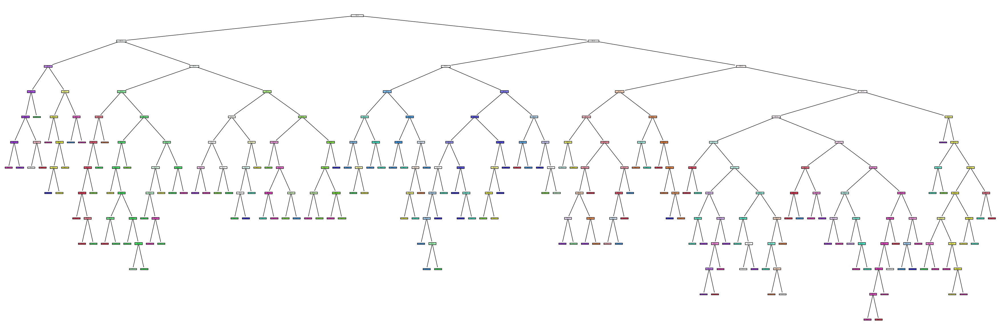

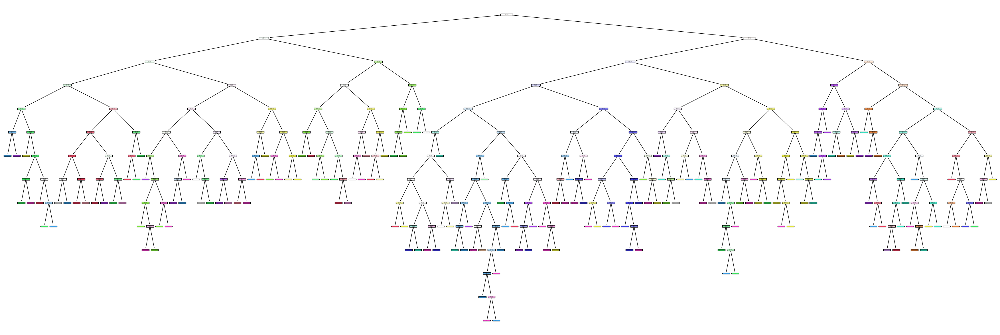

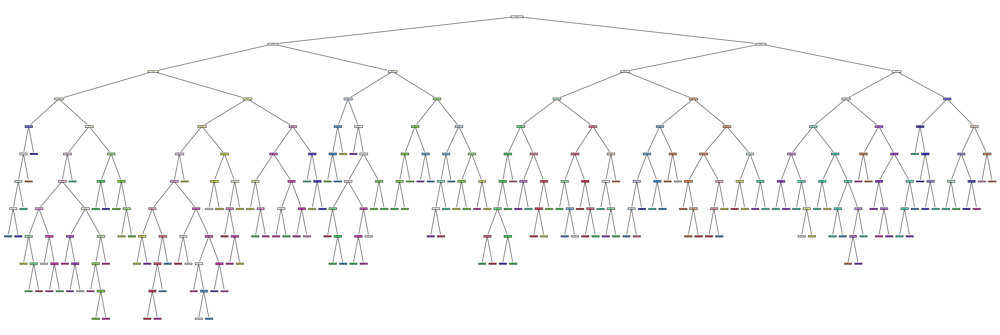

.. _wine_dataset:
Лучшие параметры: {'criterion': 'gini', 'max_depth': None, 'min_samples_split': 2, 'n_estimators': 10}
Лучший результат: 0.9857142857142858


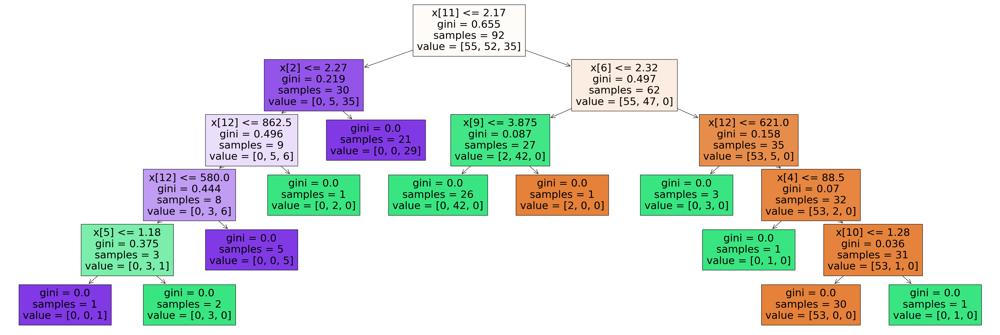

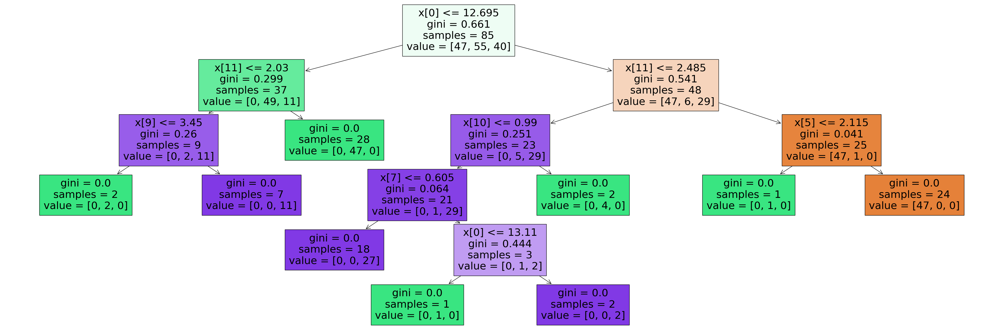

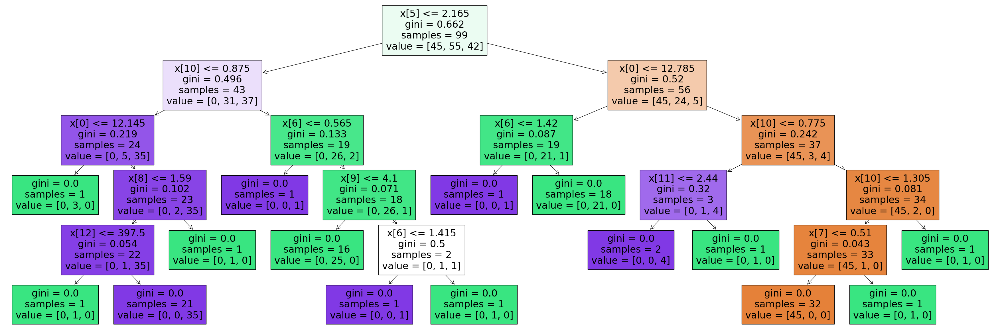

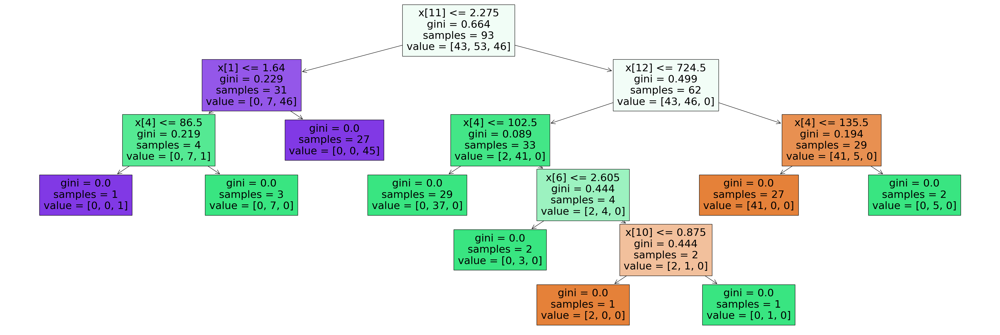

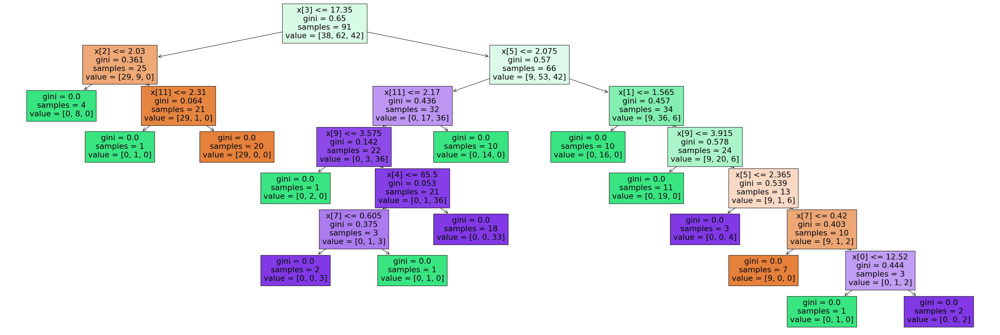

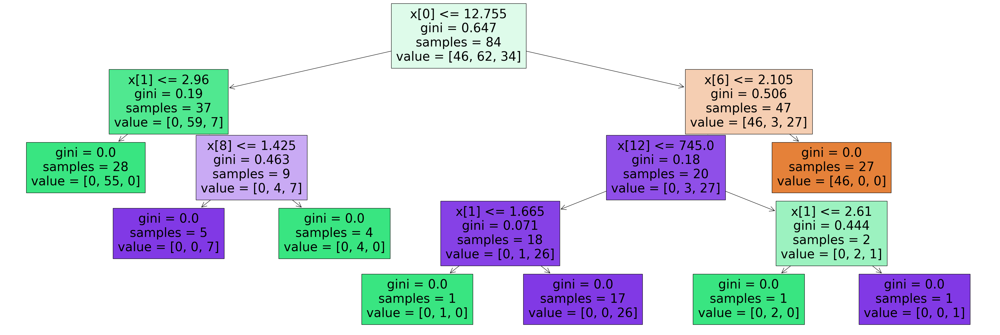

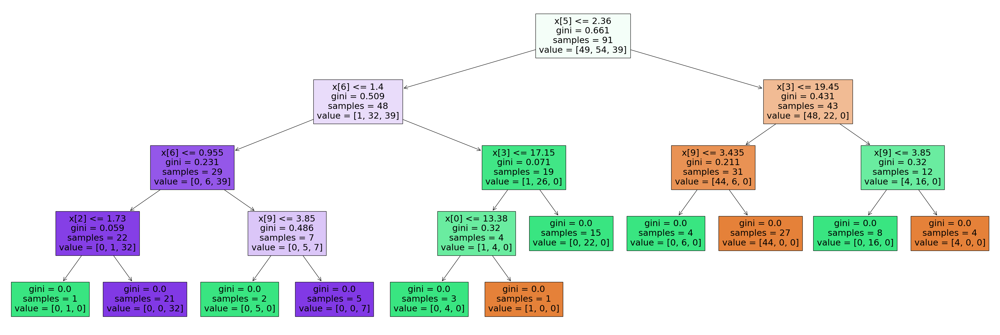

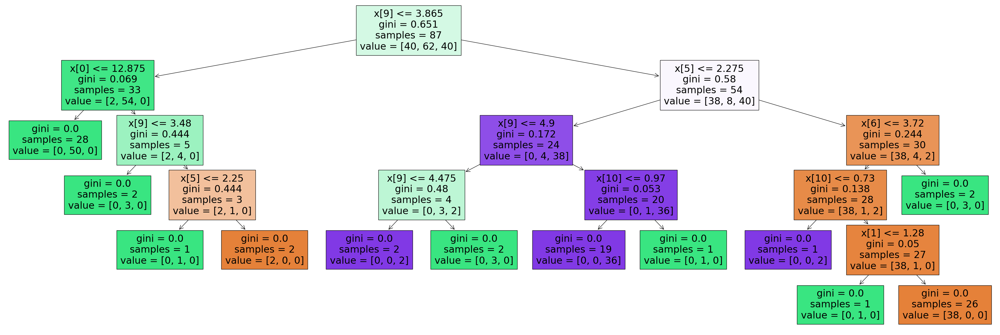

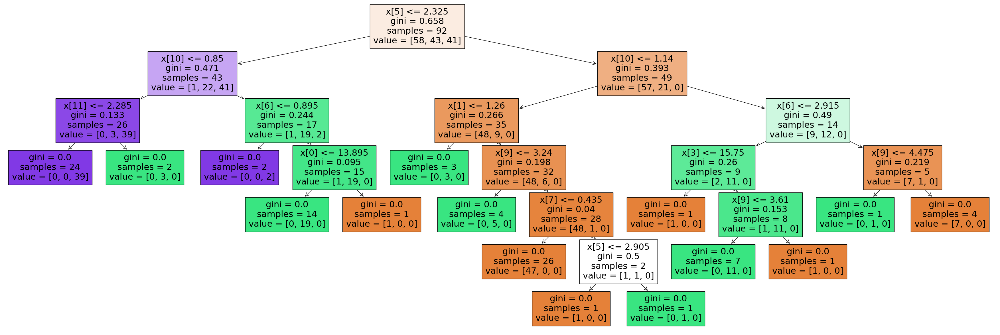

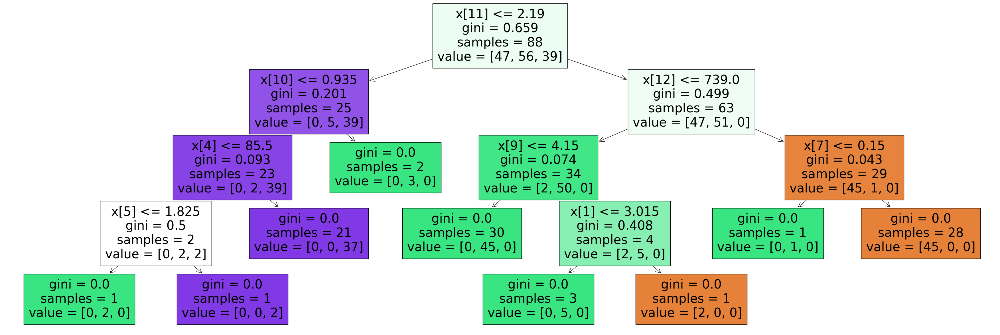

In [ ]:
for data in datasets:
  print (data['DESCR'].splitlines()[0])
  unic_forest_rand(data, parameter_r, f"Save{data['DESCR'].splitlines()[0]}.pdf")